## Modelling Antibiotic Resistance in Urinary Tract Infections in the U

This document describes a brief modelling project to see whether current models can capture observed changes in trimethoprim resistance in urinary cultures in the UK. The model looks at transmission and within-host dynamics of uropathogenic _E. coli_ in the gut microbiome

In [20]:
using DifferentialEquations, Plots, Optim, LineSearches, Distributions, GaussianProcesses, StatsBase, CSV, DataFrames, IJulia

## The Model

The model is based on the within-host competition model without differential within-host growth described in Davies et al, 2019. 

In [21]:
function tc(du, u, p, t)

    β, μ, k, c, τ, propUTI, proptreat, propT = p
    S, R, Sr, Rs = u
    X = 1 - (S + R + Sr + Rs)

    Stot = S + Sr 
    Rtot = R + Rs 

    λS = β*Stot
    λR = (1-c)*β*Rtot

    τt = propUTI*proptreat*propT*τ

    du[1] = λS*X - k*λR*S - μ*S - τt*S 
    du[2] = λR*X - k*λS*R - μ*R + τt*(Sr+Rs) 
    du[3] = k*λR*S - μ*Sr - τt*(Sr+Rs)
    du[4] = k*λS*R - μ*Rs - τt*(Sr+Rs)

end

tc (generic function with 1 method)

## Parameters

All units for parameters are in days. Parameters for the transmission rate (β) and resistance cost (c) are be fitted below. I assume that there is no barrier to acquisition of a second colonisation (k = 1). For natural clearance, there are no estimates that I am aware of for the duration of uropathogenic _E. coli_ colonisation in the gut, but I assume a long duration of 3 months (μ = 1/(30*3)). Duration of UTI symptoms after treatment are 5 days (Butler et al, 2005) - but I assume that it takes 10 days for the bacteria to be fully cleared (i.e. they persist in the gut despite being cleared from the urinary tract) (τ = 1/10). The proportion of individuals that are prescribed antibiotics if they have UTI symptoms is 0.63 (Cooper et al, 2023). 

To estimate the proportion of those who receive treatment that get trimethoprim, I used primary care prescription data from Waterlow, Ashfield and Knight, 2024. I estimated this as trimethoprim/(nitrofurantoin + trimethoprim) prescriptions per capita at each time point in the data, as these antibiotics are used almost exclusively for UTIs. At the start of the data in 2015, this was 0.623.

To estimate the proportion of individuals that develop a UTI if they have gut colonisation, I estimated this by dividing the prevalence of UTIs by the prevalence of uropathogenic _E. coli_ in the gut that I am targetting. To get the prevalence of UTIs, I found the incidence of UTI symptoms per capita over one year (0.26, Cooper et al, 2023) and the duration of UTI symptoms in the absence of treatment (9 days, Hoffman et al). The prevalence was then estimated as 0.26 * 9/365 = 0.00641. And the proportion that get UTIs as 0.00641/0.36 = 0.0178.

In [22]:
k = 1
μ = 1/(30*3)
τ = 1/10
proptreat = 0.63
proptrim = 0.6
propUTI = 0.0178

0.0178

## Model fitting

For target values, I chose the following:
- Target prevalence of uropathogens in the gut microbiome: 36% (Moreno et al, 2009). This study looked at _E. coli_ in the microbiome of 39 healthy women. They found that the clone B2 was strongly linked to UTI symptoms and was present in 36% of their samples. All samples contained some _E. coli_.
- Target frequency of resistance to trimethoprim: 33.6% (Office for Health Improvement and Disparities, 2025) This is the trimethoprim resistance rate of _E. coli_ from urine samples taken for UTI diagnosis at the start of the data series, in 2015.

First, I find a transmission rate parameter that achieves the target prevalence (36%, ) when all bacteria are sensitive.

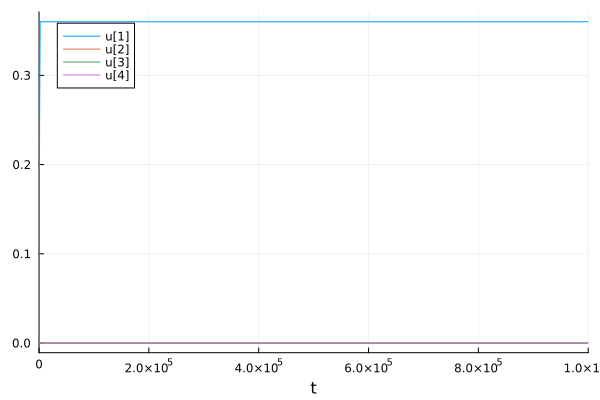

In [23]:
#Some fitting functions for the model
include("fittingfunctions.jl")

#Prevalence target
prevtarg = 0.36

#Vector of parameters, with placeholders for β and c
p = [1/110, μ, k, 1., τ, propUTI, proptreat, proptrim]

#Need a good starting point for the optimiser to work. Based on testing different values by hand:
getmetricsbeta(exp.([1/55]))
initial_x = exp.([1/55])

#Optimise
betaresults = optimize(getdistbeta, initial_x, GradientDescent())
β = log(betaresults.minimizer[1])

#Plot to show results
p = [β, μ, k, 1., τ, propUTI, proptreat, proptrim]
u0 = [0.001,0.001,0.0,0.0]
tspan = (0.,10^6)
prob = ODEProblem(tc, u0, tspan, p)
sol = solve(prob)
plot(sol)

Next, I find the resistance cost. To show the uncertainty associated with one of the parameters, I vary the proportion of the population who acquire a UTI. This requires finding a resistance cost for every value of propUTI tested. 

Note: this section is giving me trouble as it is very hard to find resistance costs and the optimiser is struggling. For the sake of trying to show what main results I want to generate, will publish this now but will work on it.

In [24]:
restarg = 0.336

#Generating different propUTI values
testvals = exp.(rand(Distributions.Normal(log(propUTI), .5), 10))

#Find a good starting point
p = [β, μ, k, 0.0087, τ, propUTI, proptreat, proptrim]
scale_val = 1.
getmetricsrescost(([0.06765]))

scale_val = 100
initial_x = scale_val .* [0.06765]

#Generate best resistance cost for each propUTI value
resistancecost = zeros(length(testvals))

for i in eachindex(testvals)
    rescostresults = optimize(getdistrescost, initial_x, 
        LBFGS(), Optim.Options(g_tol = 1e-50, iterations = 1000))
    resistancecost[i] = deepcopy(rescostresults.minimizer[1])./scale_val
end

## Varying treatment rates

Finally, I varied treatment rates according to primary care prescription data from NHS England, obtained through a Freedom of Information Request and described in Waterlow, Ashfield and Knight, 2024. Here, I vary the `propT`paramter according to the proportion of prescriptions that were trimethoprim (calculated in prescriptionanalysis.R), interpolating between time points using a gaussian process model. 

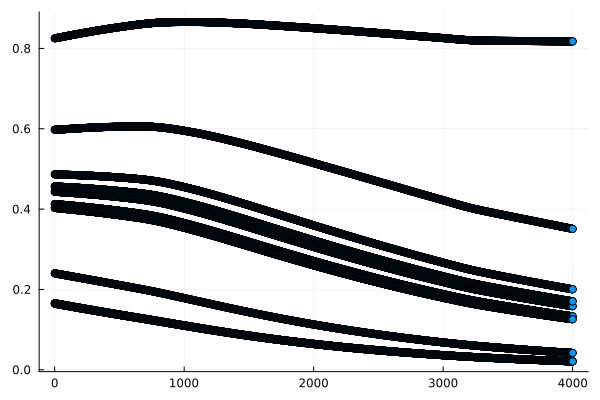

In [25]:
#Import the data 
relpresdata = CSV.File("relativeprescriptionchanges.csv") 
time = [float(relpresdata[i][1]) for i in 1:length(relpresdata)]
relpres = [relpresdata[i][2] for i in 1:length(relpresdata)]

#Function to have a time-varying treatment rate using a gaussian process function
mZero = MeanConst(exp(mean(relpres)))
kern = SE(.0,.0)
logObsNoise = -.01  

gp = GP(time./100, exp.(relpres), mZero, kern, logObsNoise)
plot(gp) #show the model
getrelpres(t) = log.(GaussianProcesses.predict_y(gp, [t/100])[1])

#Alternative version of the model that uses the time-varying propT function
function tctauvary(du, u, p, t)

    β, μ, k, c, τ, propUTI, proptreat = p
    propT = getrelpres(t)[1]
    S, R, Sr, Rs = u
    X = 1 - (S + R + Sr + Rs)

    Stot = S + Sr 
    Rtot = R + Rs 

    λS = β*Stot
    λR = (1-c)*β*Rtot

    τt = propUTI*proptreat*propT*τ

    du[1] = λS*X - k*λR*S - μ*S - τt*S 
    du[2] = λR*X - k*λS*R - μ*R + τt*(Sr+Rs) 
    du[3] = k*λR*S - μ*Sr - τt*(Sr+Rs)
    du[4] = k*λS*R - μ*Rs - τt*(Sr+Rs)

end

#And a function to get resistance frequency
function getresfreq(u)
    if sum(u) > 0
        sum(u[[2,4]])/sum(u)
    else
        0.
    end
end

#Loop through each propUTI value
p = [β, μ, k, 1., τ, propUTI, proptreat, proptrim]
p2 = [β, μ, k, 1., τ, propUTI, proptreat]

rfreqpredict = Float64[]

for i in eachindex(testvals)

    u0 = [0.1,0.1,0.,0.]
    tspan = (0.,4000.)
    p[6] = testvals[i]
    p[4] = resistancecost[i]
    probstart = ODEProblem(tc, u0, tspan, p)
    solstart = solve(probstart)

    u0 = solstart(4000.)
    tspan = (0.,4000.)
    p2[6] = testvals[i]
    p2[4] = resistancecost[i]
    prob2 = ODEProblem(tctauvary, u0, tspan, p)
    sol = solve(prob2)
    append!(rfreqpredict, [getresfreq(sol(t)) for t in 0:4000])
end

#Write to CSV; make main plot using fingertipsanalysis.R
df = DataFrame(rfreq = rfreqpredict, 
    timeindays = repeat([0:1:4000;], outer = length(testvals)),
    proputi = repeat(testvals, inner = 4001))
CSV.write("modeloutput.csv", df)

#Idea of results
scatter(repeat([0:1:4000;], 
    outer = length(testvals)), rfreqpredict,labels = false)